**LEVEL 1**

---
**Task 1 - Top cuisines**




In [ ]:
import pandas as pd


In [ ]:
df = pd.read_csv('/content/Dataset .csv')

In [ ]:
cuisine_counts = df['Cuisines'].value_counts()

In [ ]:
top_three_cuisines = cuisine_counts.nlargest(3)

In [ ]:
print(top_three_cuisines)

North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: Cuisines, dtype: int64


In [ ]:
total_restaurants = len(df)

In [ ]:
for cuisine, count in top_three_cuisines.items():
    percentage = (count / total_restaurants) * 100
    print(f"{cuisine}: {percentage:.2f}%")

North Indian: 9.80%
North Indian, Chinese: 5.35%
Chinese: 3.71%


**Task2: City Analysis**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
city_with_highest_restaurants = df['City'].value_counts().idxmax()

In [ ]:
average_ratings_by_city = df.groupby('City')['Aggregate rating'].mean()

In [ ]:
city_with_highest_avg_rating = average_ratings_by_city.idxmax()
highest_avg_rating = average_ratings_by_city.max()

In [ ]:
print(f"City with the highest number of restaurants: {city_with_highest_restaurants}")
print(f"City with the highest average rating: {city_with_highest_avg_rating}, Average Rating: {highest_avg_rating}")

City with the highest number of restaurants: New Delhi
City with the highest average rating: Inner City, Average Rating: 4.9


**Task3: Price range distribution**

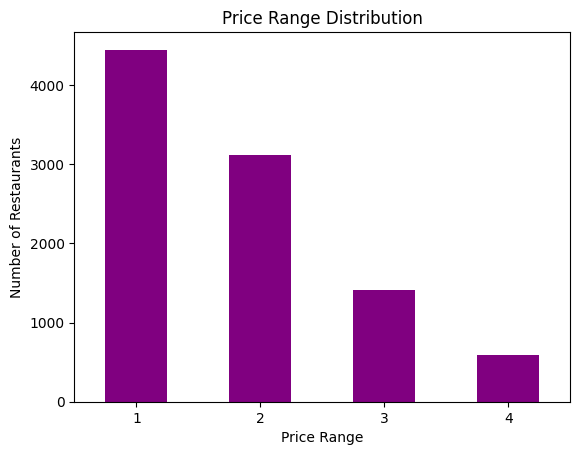

In [ ]:
df['Price range'].value_counts().sort_index().plot(kind='bar', color='Purple')
plt.title('Price Range Distribution')
plt.xlabel('Price Range')
plt.xticks(rotation=0)
plt.ylabel('Number of Restaurants')
plt.show()

In [ ]:
# Calculate the percentage of restaurants in each price range category
price_range_percentages = (df['Price range'].value_counts() / len(df)) * 100

print("Percentage of restaurants in each price range category:")
print(price_range_percentages)

Percentage of restaurants in each price range category:
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: Price range, dtype: float64


**Task4 : Online Delivery**

In [ ]:
restaurants_with_delivery = df[df['Has Online delivery'] == 'Yes']

In [ ]:
percentage_with_delivery = (len(restaurants_with_delivery) / len(df)) * 100

In [ ]:
print(f"Percentage of restaurants with online delivery: {percentage_with_delivery:.2f}%")

Percentage of restaurants with online delivery: 25.66%


In [ ]:
df['Aggregate rating'] = pd.to_numeric(df['Aggregate rating'], errors='coerce')

In [ ]:
average_rating_with_delivery = df[df['Has Online delivery'] == 'Yes']['Aggregate rating'].mean()

In [ ]:
average_rating_without_delivery = df[df['Has Online delivery'] == 'No']['Aggregate rating'].mean()

In [ ]:
print(f"Average rating of restaurants with online delivery: {average_rating_with_delivery:.2f}")
print(f"Average rating of restaurants without online delivery: {average_rating_without_delivery:.2f}")

Average rating of restaurants with online delivery: 3.25
Average rating of restaurants without online delivery: 2.47



**LEVEL 2**
---
**TASK1 : Restaurant Ratings**


In [ ]:
file_path = '/content/Dataset .csv'

In [ ]:
df = pd.read_csv(file_path)
print(df.head())


   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

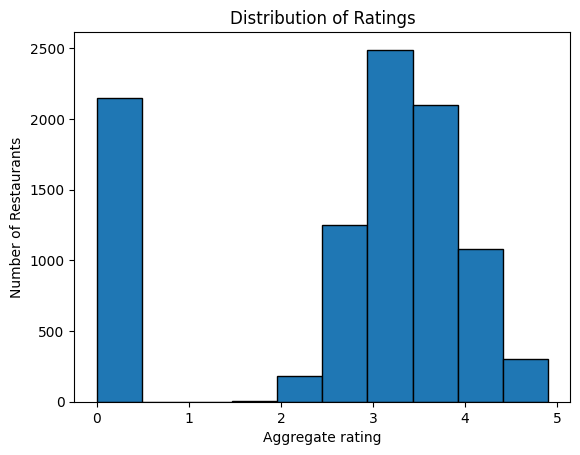

In [ ]:
plt.hist(df['Aggregate rating'], bins=10, edgecolor='black')
plt.title('Distribution of Ratings')
plt.xlabel('Aggregate rating')
plt.ylabel('Number of Restaurants')
plt.show()

In [ ]:
rating_counts = df['Aggregate rating'].value_counts()
most_common_rating = rating_counts.idxmax()
print(f'Most common rating: {most_common_rating}')

Most common rating: 0.0


In [ ]:
average_votes = df['Votes'].mean()
print(f'Average number of votes received by restaurants: {average_votes}')

Average number of votes received by restaurants: 156.909747670401


**Task2 : Cuisine Combination**

In [ ]:
print(df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [ ]:
df['Cuisines'] = df['Cuisines'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])

In [ ]:
df['CuisineCombination'] = df['Cuisines'].apply(tuple)

In [ ]:
average_ratings_by_combination = df.groupby('CuisineCombination')['Aggregate rating'].mean()

In [ ]:
highest_rated_combination = average_ratings_by_combination.idxmax()
highest_average_rating = average_ratings_by_combination.max()

In [ ]:
print(f'The cuisine combination with the highest average rating is {highest_rated_combination}' )
print(f'with an average rating of {highest_average_rating:.2f}')

The cuisine combination with the highest average rating is ('American', 'BBQ', 'Sandwich')
with an average rating of 4.90


**Task3 : Geographic Analysis**

In [ ]:

import folium
from folium.plugins import MarkerCluster



In [ ]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

In [ ]:
marker_cluster = MarkerCluster().add_to(restaurant_map)

In [ ]:
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant Name']).add_to(marker_cluster)

In [ ]:
restaurant_map.save('restaurant_locations_map.html')

In [ ]:
restaurant_map

**Task4 : Restaurant Chains**

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
restaurant_chain_counts = df['Restaurant Name'].value_counts()

In [ ]:
restaurant_chains = restaurant_chain_counts[restaurant_chain_counts > 1]

In [ ]:
print('Identified Restaurant Chains:')
print(restaurant_chains)

Identified Restaurant Chains:
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: Restaurant Name, Length: 734, dtype: int64


In [ ]:
chain_ratings = df[df['Restaurant Name'].isin(restaurant_chains.index)].groupby('Restaurant Name')['Aggregate rating'].mean()
chain_popularity = restaurant_chain_counts[restaurant_chain_counts.index.isin(chain_ratings.index)]

In [ ]:
print('\nAverage Ratings of Restaurant Chains:')
print(chain_ratings)



Average Ratings of Restaurant Chains:
Restaurant Name
10 Downing Street       4.000000
221 B Baker Street      3.366667
34 Parkstreet Lane      3.050000
34, Chowringhee Lane    2.791667
4700BC Popcorn          3.500000
                          ...   
Zaika                   2.850000
Zaika Kathi Rolls       1.500000
Zizo                    3.866667
Zooby's Kitchen         3.150000
bu��no                  3.750000
Name: Aggregate rating, Length: 734, dtype: float64


In [ ]:
print('\nPopularity (Number of Locations) of Restaurant Chains:')
print(chain_popularity)


Popularity (Number of Locations) of Restaurant Chains:
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: Restaurant Name, Length: 734, dtype: int64


**LEVEL 3**

---
Task 2 : Votes Analysis


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
highest_votes_restaurant = df.loc[df['Votes'].idxmax()]
lowest_votes_restaurant = df.loc[df['Votes'].idxmin()]

In [ ]:
print('\nRestaurant with the Highest Number of Votes:')
print(highest_votes_restaurant)


Restaurant with the Highest Number of Votes:
Restaurant ID                                                       51705
Restaurant Name                                                      Toit
Country Code                                                            1
City                                                            Bangalore
Address                 298, Namma Metro Pillar 62, 100 Feet Road, Ind...
Locality                                                      Indiranagar
Locality Verbose                                   Indiranagar, Bangalore
Longitude                                                       77.640709
Latitude                                                        12.979166
Cuisines                                       [Italian, American, Pizza]
Average Cost for two                                                 2000
Currency                                               Indian Rupees(Rs.)
Has Table booking                                                 

In [ ]:
print('\nRestaurant with the Lowest Number of Votes:')
print(lowest_votes_restaurant)


Restaurant with the Lowest Number of Votes:
Restaurant ID                                                     6710645
Restaurant Name                                          Cantinho da Gula
Country Code                                                           30
City                                                           S��o Paulo
Address                 Rua Pedroso Alvarenga, 522, Itaim Bibi, S��o P...
Locality                                                       Itaim Bibi
Locality Verbose                                   Itaim Bibi, S��o Paulo
Longitude                                                      -46.675667
Latitude                                                          -23.581
Cuisines                                                      [Brazilian]
Average Cost for two                                                   55
Currency                                               Brazilian Real(R$)
Has Table booking                                                  

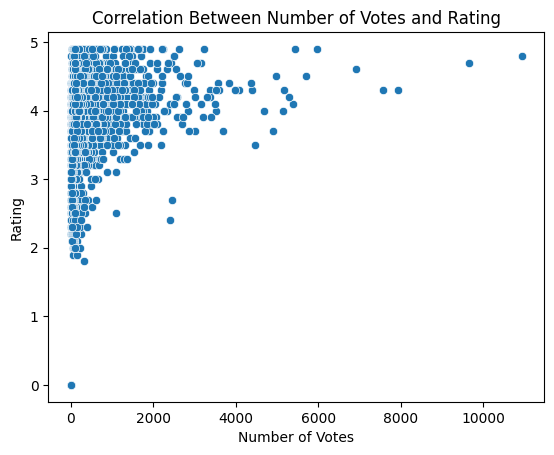

In [ ]:
sns.scatterplot(x='Votes', y='Aggregate rating', data=df)
plt.title('Correlation Between Number of Votes and Rating')
plt.xlabel('Number of Votes')
plt.ylabel('Rating')
plt.show()

**Task3 : Price range vs. Online Delivery and Table Booking**

In [ ]:
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
contingency_online_delivery = pd.crosstab(df['Price range'], df['Has Online delivery'])
contingency_table_booking = pd.crosstab(df['Price range'], df['Has Table booking'])

In [ ]:
chi2_online_delivery, p_online_delivery, _, _ = stats.chi2_contingency(contingency_online_delivery)
chi2_table_booking, p_table_booking, _, _ = stats.chi2_contingency(contingency_table_booking)

In [ ]:
print(f'\nChi-square test for Online Delivery:\nChi2 Value: {chi2_online_delivery}\nP-value: {p_online_delivery}')
print(f'\nChi-square test for Table Booking:\nChi2 Value: {chi2_table_booking}\nP-value: {p_table_booking}')


Chi-square test for Online Delivery:
Chi2 Value: 721.3786767489615
P-value: 4.855491091732406e-156

Chi-square test for Table Booking:
Chi2 Value: 2821.5808929580135
P-value: 0.0


Text(0, 0.5, 'Count')

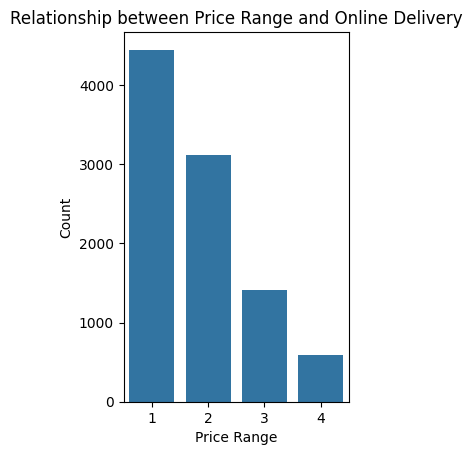

In [ ]:
# Plotting: Relationship between Price Range and Online Delivery/Table Booking
# Online Delivery
plt.subplot(1, 2, 1)
sns.countplot(x='Price range', data=df)
plt.title('Relationship between Price Range and Online Delivery')
plt.xlabel('Price Range')
plt.ylabel('Count')

Text(0, 0.5, 'Count')

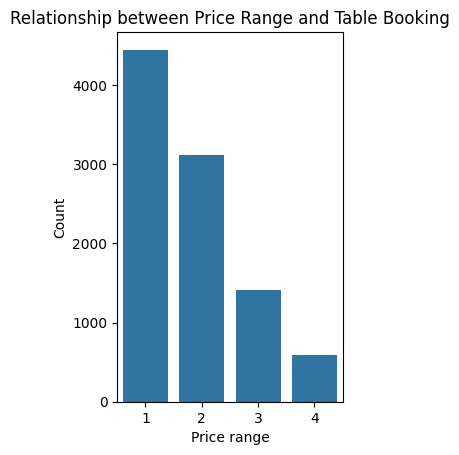

In [ ]:
# Table Booking
plt.subplot(1, 2, 2)
sns.countplot(x='Price range', data=df)
plt.title('Relationship between Price Range and Table Booking')
plt.xlabel('Price range')
plt.ylabel('Count')